# **Image Classification Project: Tomato Leaf Disease Identification**


---

## **Presented by**
Faishal Anwar Hasyim

[LinkedIn](https://www.linkedin.com/in/faishal-anwar-hasyim-1391682a5/) | [Instagram](https://www.instagram.com/faishalah97?igsh=azA0dGFjM3lkd2Jm) | [Github](https://github.com/Faishal-Anwar) |
[Dicoding Profile](https://www.dicoding.com/users/anwarfaishal86/academies)

## **Objective**
This project aims to develop a machine learning model using an image classification approach to accurately identify various types of diseases on tomato leaves and distinguish them from healthy leaves. By leveraging the public kaustubhb999/tomatoleaf dataset, which contains 10 classes of leaf conditions, this model is designed to be an automated diagnostic tool.

[dataset link](https://www.kaggle.com/datasets/kaustubhb999/tomatoleaf) : tomatoleaf dataset

## 1. Import Libraries

In [1]:
import os  # Operating system interfaces
import tensorflow as tf                                    # TensorFlow deep learning framework
import matplotlib.pyplot as plt                            # Plotting library
import matplotlib.image as mpimg                           # Image loading and manipulation library
from PIL import Image
import numpy as np
from tensorflow.keras.models import Sequential, Model      # Sequential and Functional API for building models
from tensorflow.keras.optimizers import Adam               # Adam optimizer for model training
from tensorflow.keras.callbacks import EarlyStopping       # Early stopping callback for model training
from tensorflow.keras.regularizers import l1, l2           # L1 and L2 regularization for model regularization
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Data augmentation and preprocessing for images
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, BatchNormalization
# Various types of layers for building neural networks
from tensorflow.keras.applications import DenseNet121, EfficientNetB4, Xception, VGG16, VGG19   # Pre-trained models for transfer learning

# 2. Loading Dataset

In [2]:
from google.colab import files
files.upload()  # pilih file kaggle.json (api key) from kaggle

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"anwarfaishal97","key":"03e5f202dc261e00aa825c038209dda7"}'}

In [4]:
# Download kaggle dataset and unzip the file
!mkdir -p /root/.kaggle
!cp kaggle.json /root/.kaggle/kaggle.json
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d kaustubhb999/tomatoleaf
!unzip tomatoleaf.zip

Output streaming akan dipotong hingga 5000 baris terakhir.
  inflating: tomato/train/Tomato___Target_Spot/002213fb-b620-4593-b9ac-6a6cc119b100___Com.G_TgS_FL 8360.JPG  
  inflating: tomato/train/Tomato___Target_Spot/0044d10f-7062-4655-8abd-9fffc5b2f152___Com.G_TgS_FL 7908.JPG  
  inflating: tomato/train/Tomato___Target_Spot/00854623-ba28-446d-a1d5-03c0ae3f99d9___Com.G_TgS_FL 7949.JPG  
  inflating: tomato/train/Tomato___Target_Spot/0118c27a-f34a-41e1-8b2f-d2c564f83c5c___Com.G_TgS_FL 0013.JPG  
  inflating: tomato/train/Tomato___Target_Spot/0118ed61-b135-45be-ad81-7e2d54203be4___Com.G_TgS_FL 8241.JPG  
  inflating: tomato/train/Tomato___Target_Spot/0197df47-a9cb-4b6c-b72c-ac0e9af6d135___Com.G_TgS_FL 0779.JPG  
  inflating: tomato/train/Tomato___Target_Spot/025510ac-15db-4861-b02b-21da82161100___Com.G_TgS_FL 0952.JPG  
  inflating: tomato/train/Tomato___Target_Spot/0288164e-d6cf-4215-b593-7b581308a4cf___Com.G_TgS_FL 9777.JPG  
  inflating: tomato/train/Tomato___Target_Spot/03002b91-afe3-

# 3. Data preprocessing

In [5]:
train_data = tf.keras.utils.image_dataset_from_directory(
    'tomato/train',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32)

train_data = train_data.map(lambda x, y: (x / 255.0, y))

Found 10000 files belonging to 10 classes.


In [6]:
val_data = tf.keras.preprocessing.image_dataset_from_directory(
    'tomato/val',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32)

val_data = val_data.map(lambda x, y: (x / 255.0, y))

Found 1000 files belonging to 10 classes.


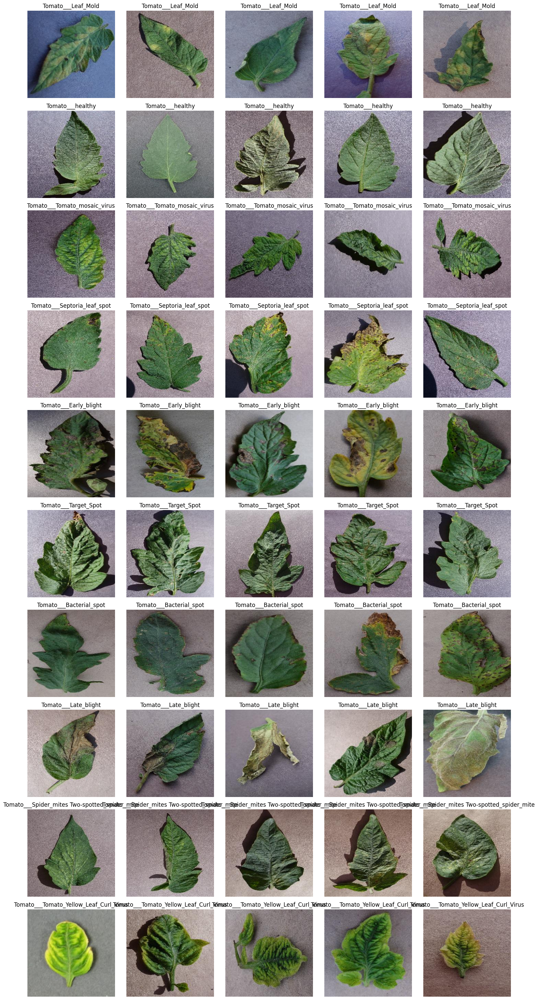

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Path folder train
path = "tomato/train"

# Inisialisasi kamus
tomato_image = {}

# Ambil hanya folder kelas (subdirektori)
for class_name in os.listdir(path):
    class_path = os.path.join(path, class_name)
    if os.path.isdir(class_path):
        # Ambil hanya file gambar di dalam folder kelas
        images = [f for f in os.listdir(class_path)
                  if os.path.isfile(os.path.join(class_path, f)) and f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if images:
            tomato_image[class_name] = images

# Visualisasi 5 gambar acak dari tiap kelas
fig, axs = plt.subplots(len(tomato_image.keys()), 5, figsize=(15, 3 * len(tomato_image)))

for i, class_name in enumerate(tomato_image.keys()):
    images = np.random.choice(tomato_image[class_name], 5, replace=False)
    for j, image_name in enumerate(images):
        img_path = os.path.join(path, class_name, image_name)
        img = Image.open(img_path)
        axs[i, j].imshow(img)
        axs[i, j].set_title(class_name)
        axs[i, j].axis('off')

fig.tight_layout()
plt.show()


# 4. Modeling

In [8]:
conv_base = DenseNet121(
    weights='imagenet',
    include_top = False,
    input_shape=(256,256,3),
    pooling='avg'
)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [9]:
conv_base.trainable = False

In [10]:
# Summary of the pretrained model
conv_base.summary()

Model: "densenet121"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 262, 262,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 64, 64,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 64, 64,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 64, 64,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 64, 64,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 64, 64,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 64, 64,    │     12,288 │ conv2_block2_0_r

 Total params: 7,037,504 (26.85 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 7,037,504 (26.85 MB)

In [11]:
model = Sequential()
model.add(conv_base)
model.add(BatchNormalization())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.35))
model.add(BatchNormalization())
model.add(Dense(120, activation='relu'))
model.add(Dense(10, activation='softmax'))

In [12]:
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [13]:
# history = model.fit(train_ds,epochs=10,validation_data=validation_ds)
history = model.fit(train_data, epochs=100, validation_data=val_data, callbacks=[EarlyStopping(patience=0)])

Epoch 1/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 98s 209ms/step - accuracy: 0.3558 - loss: 1.9375 - val_accuracy: 0.7720 - val_loss: 0.8723
Epoch 2/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - accuracy: 0.7497 - loss: 0.7823 - val_accuracy: 0.8490 - val_loss: 0.5058
Epoch 3/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - accuracy: 0.8237 - loss: 0.5474 - val_accuracy: 0.8760 - val_loss: 0.3942
Epoch 4/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.8586 - loss: 0.4318 - val_accuracy: 0.8890 - val_loss: 0.3341
Epoch 5/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 39s 96ms/step - accuracy: 0.8923 - loss: 0.3456 - val_accuracy: 0.9000 - val_loss: 0.2957
Epoch 6/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 30s 96ms/step - accuracy: 0.9027 - loss: 0.2966 - val_accuracy: 0.9080 - val_loss: 0.2641
Epoch 7/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - accuracy: 0.9208 - loss: 0.2463 - val_accuracy: 0.9150 - val_loss: 0.2433
Epoch 8/100
313/313 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - accuracy: 0.9279 - loss

# 5. Evaluation

In [14]:
# Evaluate the model on the validation data
evaluation = model.evaluate(val_data)

# Print the evaluation metrics
print("Validation Loss:", evaluation[0])
print("Validation Accuracy:", evaluation[1])

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 84ms/step - accuracy: 0.9352 - loss: 0.1850
Validation Loss: 0.18523231148719788
Validation Accuracy: 0.9330000281333923


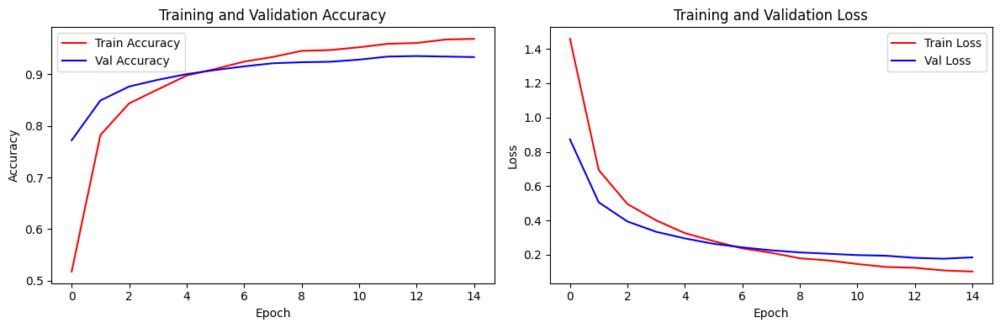

In [15]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np

# Asumsi variabel `history` sudah didapat dari model.fit()
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

# Plot Horizontal: Accuracy
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'r', label='Train Accuracy')
plt.plot(epochs, val_acc, 'b', label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot Horizontal: Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'r', label='Train Loss')
plt.plot(epochs, val_loss, 'b', label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [16]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Ambil label sebenarnya dan prediksi model dari data validasi
y_true = []
y_pred = []

for images, labels in val_data:
    preds = model.predict(images)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

# Ambil class names (jika val_data sudah dimap)
class_names = sorted(os.listdir('tomato/val'))  # Pastikan urutan sesuai label

# Report dalam bentuk dict → DataFrame
report_dict = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
report_df = pd.DataFrame(report_dict).transpose().round(3)

# Tampilkan tabel
print("📊 Classification Report (tabel):")
display(report_df)

1/1 ━━━━━━━━━━━━━━━━━━━━ 11s 11s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0

,precision,recall,f1-score,support
Tomato___Bacterial_spot,0.961,0.990,0.975,100.000
Tomato___Early_blight,0.946,0.870,0.906,100.000
Tomato___Late_blight,0.889,0.960,0.923,100.000
Tomato___Leaf_Mold,0.935,0.870,0.902,100.000
Tomato___Septoria_leaf_spot,0.876,0.920,0.898,100.000
Tomato___Spider_mites Two-spotted_spider_mite,0.919,0.910,0.915,100.000
Tomato___Target_Spot,0.922,0.830,0.874,100.000
Tomato___Tomato_Yellow_Leaf_Curl_Virus,0.970,0.980,0.975,100.000
Tomato___Tomato_mosaic_virus,0.952,1.000,0.976,100.000
Tomato___healthy,0.962,1.000,0.980,100.000


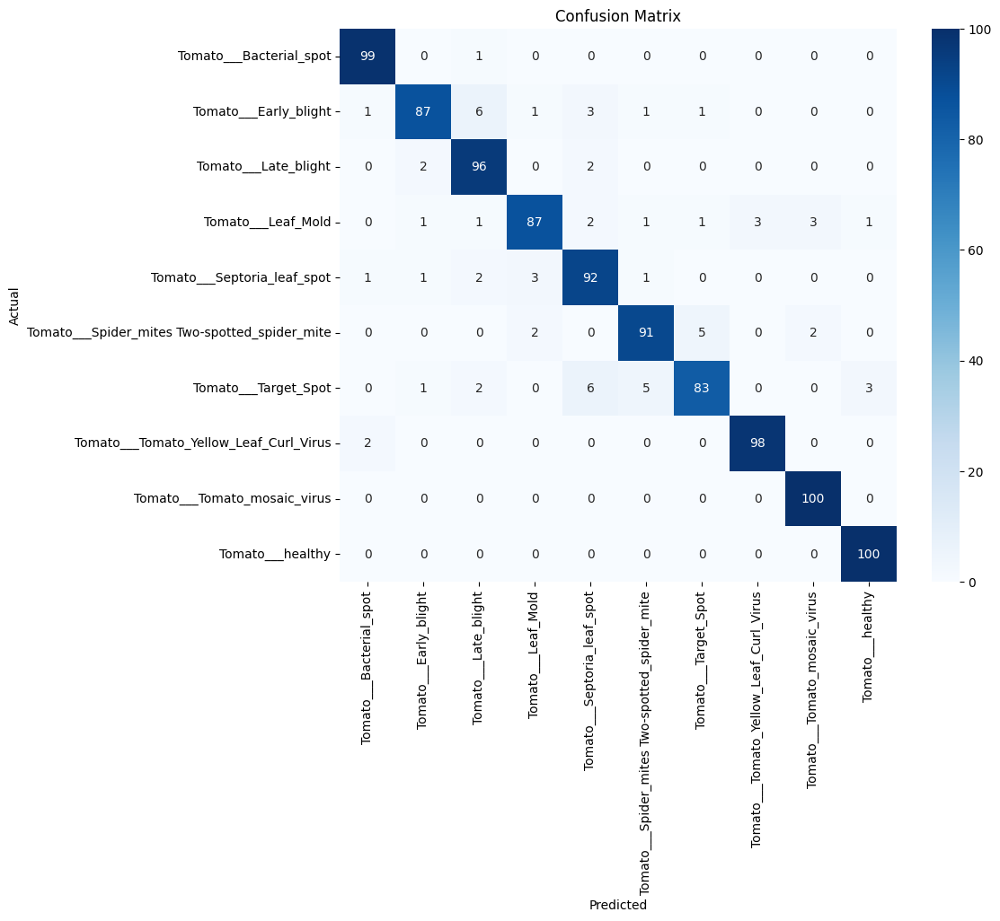

In [17]:
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Saving 1b4ded19-b85b-4916-a158-6d8203062996___YLCV_GCREC 2230.JPG to 1b4ded19-b85b-4916-a158-6d8203062996___YLCV_GCREC 2230.JPG


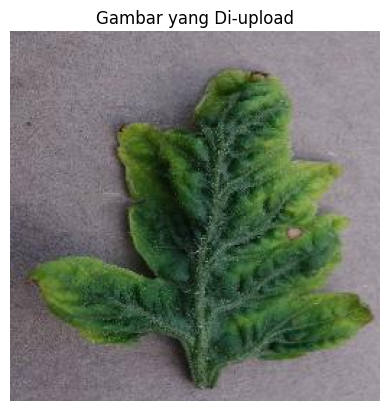

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
✅ penyakit : Tomato Yellow Leaf Curl Virus


In [22]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from google.colab import files
from PIL import Image
import os

# Upload gambar
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

# Buka, ubah ukuran, dan tampilkan gambar
img = Image.open(img_path).convert('RGB')
img = img.resize((256, 256))  # Sesuaikan dengan input_shape modelmu

plt.imshow(img)
plt.axis('off')
plt.title("Gambar yang Di-upload")
plt.show()

# Konversi ke array dan normalisasi
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Normalisasi

# Prediksi
prediction = model.predict(img_array)
predicted_class = np.argmax(prediction)

# Ambil nama kelas dari folder validasi
class_names = sorted(os.listdir('tomato/val'))

# Format output
nama_penyakit = class_names[predicted_class].replace("Tomato___", "").replace("_", " ")
print("✅ penyakit :", nama_penyakit)

Saving 2aa365ee-c396-47e3-bf04-aad9d18f470f___Crnl_L.Mold 6655.JPG to 2aa365ee-c396-47e3-bf04-aad9d18f470f___Crnl_L.Mold 6655.JPG


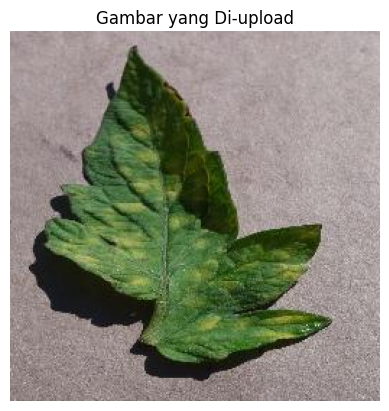

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
✅ penyakit : Leaf Mold


In [40]:
# Upload gambar
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

# Buka, ubah ukuran, dan tampilkan gambar
img = Image.open(img_path).convert('RGB')
img = img.resize((256, 256))  # Sesuaikan dengan input_shape modelmu

plt.imshow(img)
plt.axis('off')
plt.title("Gambar yang Di-upload")
plt.show()

# Konversi ke array dan normalisasi
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Normalisasi

# Prediksi
prediction = model.predict(img_array)
predicted_class = np.argmax(prediction)

# Ambil nama kelas dari folder validasi
class_names = sorted(os.listdir('tomato/val'))

# Format output
nama_penyakit = class_names[predicted_class].replace("Tomato___", "").replace("_", " ")
print("✅ penyakit :", nama_penyakit)

Saving 0a610d40-f5b8-4580-8e32-cc90b3620017___Com.G_TgS_FL 8191.JPG to 0a610d40-f5b8-4580-8e32-cc90b3620017___Com.G_TgS_FL 8191.JPG


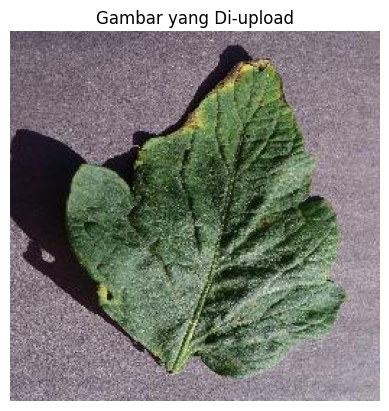

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
✅ penyakit : Target Spot


In [41]:
# Upload gambar
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

# Buka, ubah ukuran, dan tampilkan gambar
img = Image.open(img_path).convert('RGB')
img = img.resize((256, 256))  # Sesuaikan dengan input_shape modelmu

plt.imshow(img)
plt.axis('off')
plt.title("Gambar yang Di-upload")
plt.show()

# Konversi ke array dan normalisasi
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0  # Normalisasi

# Prediksi
prediction = model.predict(img_array)
predicted_class = np.argmax(prediction)

# Ambil nama kelas dari folder validasi
class_names = sorted(os.listdir('tomato/val'))

# Format output
nama_penyakit = class_names[predicted_class].replace("Tomato___", "").replace("_", " ")
print("✅ penyakit :", nama_penyakit)

## 6. Save Model

In [42]:
model.save("tomato_model.h5")  # Format HDF5

In [43]:
!pip freeze > requirements.txt